In [1]:
from IPython.display import display
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt

# TP1
Le TP2 est à la suite du TP1 certaines fonctions du TP1 sont réutilisées dans le TP2

2. Ecrire une fonction qui permet de parcourir la base et d'afficher les noms d'images.

In [ ]:
import os

def get_links_images(startpath):
	l = []
	for root, dirs, files in os.walk(startpath):
		root = os.path.basename(root)
		for f in files:
			if(f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg")):
				# print(f'{startpath}/{root}/{f}')
				l.append(f'{startpath}/{root}/{f}')
	return np.array(l)

print(get_links_images('./BD IIC'))


3. Ecrire une fonction qui permet d'ouvrir une image de la base et de l'afficher

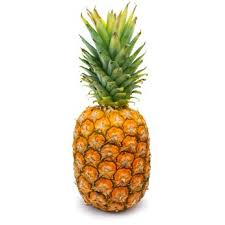

In [3]:
def get_image(path, afficher=False, image_size=None):
	im = Image.open(path).convert("RGB")
	if image_size != None : 
		im = im.resize(image_size)
	if afficher : display(im)
	return np.asarray(im)

im = get_image("./BD IIC/Ananas/image081.jpg", afficher = True)

4. Ecrire quatre fonctions de conversion d'images couleur en niveau de gris selon les trois formules suivantes:

    - ng = (R + G + B) / 3
    - ng = 0.2990\*R + 0.5870\*G + 0.1140\*B
    - ng = 0.2126\*R + 0.7152\*G + 0.0722\*B
    - ng = 0.2627\*R + 0.6780\*G + 0.0593\*B


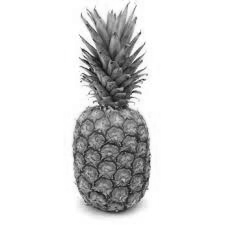

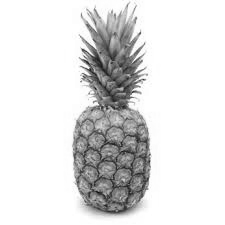

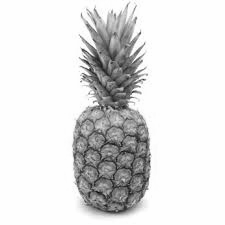

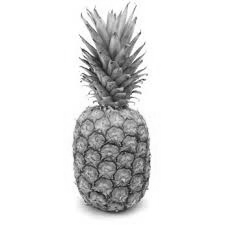

In [4]:
def to_ng(r, g, b, ir, ig, ib):
    return ir * r + ig * g + ib * b

imng1 = np.vectorize(to_ng)(im[:, :, 0], im[:, :, 1], im[:, :, 2], 1/3, 1/3, 1/3)
imng2 = np.vectorize(to_ng)(im[:, :, 0], im[:, :, 1], im[:, :, 2], 0.299, 0.587, 0.114)
imng3 = np.vectorize(to_ng)(im[:, :, 0], im[:, :, 1], im[:, :, 2], 0.2126, 0.7152, 0.0722)
imng4 = np.vectorize(to_ng)(im[:, :, 0], im[:, :, 1], im[:, :, 2], 0.2627, 0.6780, 0.0593)

display(Image.fromarray(imng1.astype(np.uint8)))
display(Image.fromarray(imng2.astype(np.uint8)))
display(Image.fromarray(imng3.astype(np.uint8)))
display(Image.fromarray(imng4.astype(np.uint8)))

5. Ecrire une image qui permet la réduction du nombre de couleurs, elle a comme paramètre, l'image couleur et  les quantifications des trois canaux (R,G,B) .

In [ ]:
Qr = 4
Qg = 4
Qb = 4

def get_index(r, g, b, Qr, Qg, Qb):
	Pr = 256 // Qr # 64
	Pg = 256 // Qg
	Pb = 256 // Qb
	return (r // Pr) * (Qg * Qb) + (g // Pg) * (Qb) + (b // Pb)



indexed_image = np.vectorize(get_index)(im[:, :, 0], im[:, :, 1], im[:, :, 2], Qr, Qg, Qb)
print(indexed_image)

6. Ecrire une fonction moy_var qui reçoit une image niveau de gris ou indexée et retourne un vecteur descripteur comportant deux composantes (la moyenne et la variance).

In [6]:
def moy_var(im):
    return [np.mean(im), np.var(im)]

v_im  = moy_var(indexed_image)
v_ng1 = moy_var(imng1)
v_ng2 = moy_var(imng2)
v_ng3 = moy_var(imng3)
v_ng4 = moy_var(imng4)

print(v_im)
print(v_ng1)
print(v_ng2)
print(v_ng3)
print(v_ng4)

[57.3216, 161.01524998320988]
[220.88843456790124, 3829.0934582298073]
[224.40871972345676, 3189.7406871992525]
[224.38390200098763, 3209.143488991815]
[225.04500432987652, 3088.0331526228356]


7. Calculer ce descripteur pour l'ensemble des images de la base.

In [ ]:
def tree(startpath):
	l = list()
	iclass = 0
	for root, dirs, files in os.walk(startpath):
		nclass = True
		for f in files:
			if(f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg")):
				if(nclass):
					nclass = False
					iclass += 1
					className = root.split('\\')[1]
				image = get_image(f"{root}/{f}")
				# image = np.vectorize(get_index)(image[:, :, 0], image[:, :, 1], image[:, :, 2], Qr, Qg, Qb)
				l.append([np.mean(image), np.var(image), iclass, className])
	return l

desc = np.array(tree("./BD IIC"))
print(desc)

8. En considérant les composantes (moyenne, variance) comme des coordonnées de points, afficher les points représentant les images de la base dans un plot. Utiliser une couleur par classe d'images.

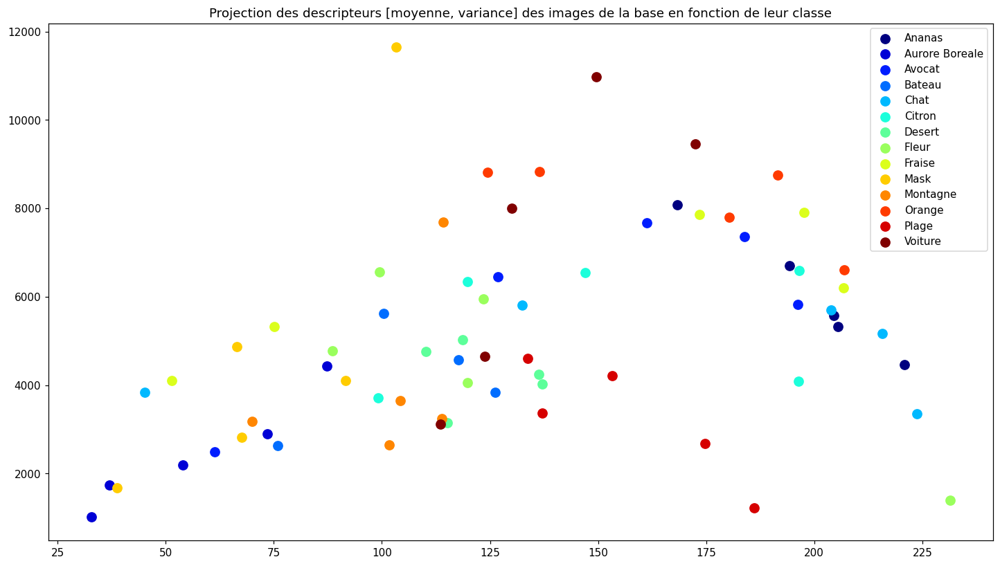

In [8]:
plt.figure(figsize=(16, 9), dpi=110)
plt.title("Projection des descripteurs [moyenne, variance] des images de la base en fonction de leur classe")
x = np.array(desc[::, 0], dtype=float)
y = np.array(desc[::, 1], dtype=float)
c = np.array(desc[::, 2], dtype=int)
l = np.array(desc[::, 3], dtype=str)
colors = [plt.cm.jet(i/float(len(np.unique(l))-1)) for i in range(len(np.unique(l)))]
for i, u in enumerate(np.unique(l)):
	xi = [x[j] for j  in range(len(x)) if l[j] == u]
	yi = [y[j] for j  in range(len(x)) if l[j] == u]
	plt.scatter(xi, yi, color=colors[i], label=str(u), s=75)
plt.legend()
plt.show()

9. Ecrire quatre fonctions de calcul de distances entre deux vecteurs descripteurs. ( Manahattan , Euclidienne, Minkowski, Tchebychev):  https://fr.wikipedia.org/wiki/Distance_(math%C3%A9matiques)

In [9]:
def manhattan(a, b):
    return np.sum([np.abs(val1 - val2) for val1, val2 in zip(a,b)])

def euclidian(a, b):
    return np.sqrt(np.sum(np.square(a - b)))
 
def minkowski(a, b, p_val):
    dist = (np.abs(a - b) ** p_val).sum(axis=1) ** (1 / p_val)
    return dist

def tchebychev(a, b):
    return np.max(a - b)

10. Ecrire une fonction une reçoit une image requête et une distance et qui utilise sa formule pour calculer la distance entre l'image requête et l'ensemble des images de la base. Tester cette fonction en utilisant le premier descripteur (moyenne, variance) 
11. Ecrire une fonction qui reçoit le vecteur des distances et retourne la liste de noms d'images triée selon les valeurs de distance.

In [10]:
def distance_image_base(path, dist=euclidian, desc=moy_var):
	image = get_image(path)
	# image = np.vectorize(get_index)(image[:, :, 0], image[:, :, 1], image[:, :, 2])
	descimage = desc(image)
	l = list()
	for root, dirs, files in os.walk("./BD IIC"):
		for f in files:
			if(f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg")):
				im = get_image(f"{root}/{f}")
				# im = np.vectorize(get_index)(im[:, :, 0], im[:, :, 1], im[:, :, 2])
				d = desc(im)
				l.append([dist(np.array(descimage), np.array(d)), f"{root}/{f}"])
	l = np.array(l)
	l = l[np.array(l[:, 0], dtype=float).argsort()]
	return l

    

In [ ]:
request_image = "BD IIC/Ananas/image081.jpg"
distanceBase = distance_image_base(request_image, euclidian, moy_var)
print(distanceBase)

12. Ecrire une fonction qui reçoit l'image requête, la liste des images triées et un paramètre K.  Elle affichera dans le même "plot" l'image requête et les K images qui lui ressemble le plus.

No handles with labels found to put in legend.


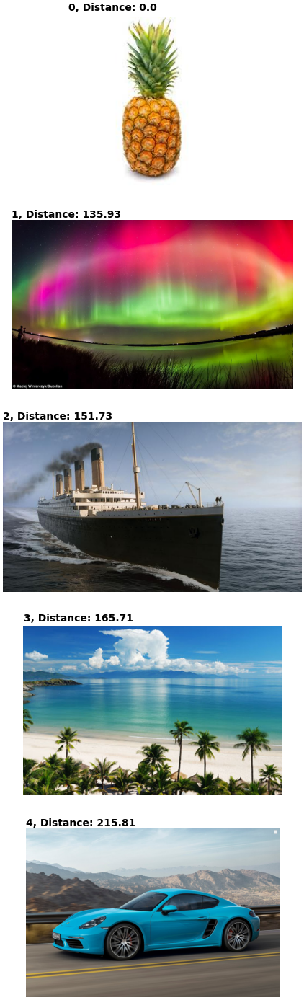

In [12]:
def display_similar(image_path, li, k=1, image_size=None, dpi=40):
	fig = plt.figure(figsize=(16, 9 * k), dpi=dpi)
	for i in range(k):
		# display(li[i, 1])
		im = get_image(li[i, 1], image_size=image_size)
		# display(Image.fromarray(im))
		fig.add_subplot(k, 1, i + 1)
		plt.text(x = 0, y = -10, s=f"{i}, Distance: {np.around(float(li[i, 0]), 2)}", font={'size': 25, 'weight' : 'bold'})
		plt.imshow(im)
		plt.axis('off')

	plt.legend()
	plt.show()

display_similar(request_image, distanceBase, 5)

13. Ecrire de nouvelles fonctions de descripteurs:
    - Histogramme de niveaux de gris
    - Histogramme de couleurs indexées
    - Histogramme concaténant les histogrammes des trois composantes.  

In [13]:
def hist_ng(im):
	v = np.vectorize(to_ng)(im[:, :, 0], im[:, :, 1], im[:, :, 2], 1/3, 1/3, 1/3)
	v = np.round(v)
	v = v.flatten()
	v = np.append(v, np.arange(256)) # petite astuce pour etre certain d'avoir des representants de tout les ng possible
	unique, counts = np.unique(v, return_counts=True)
	counts = counts - 1 # on retire ceux qu'on a ajouté juste avant
	return counts / np.sum(counts)

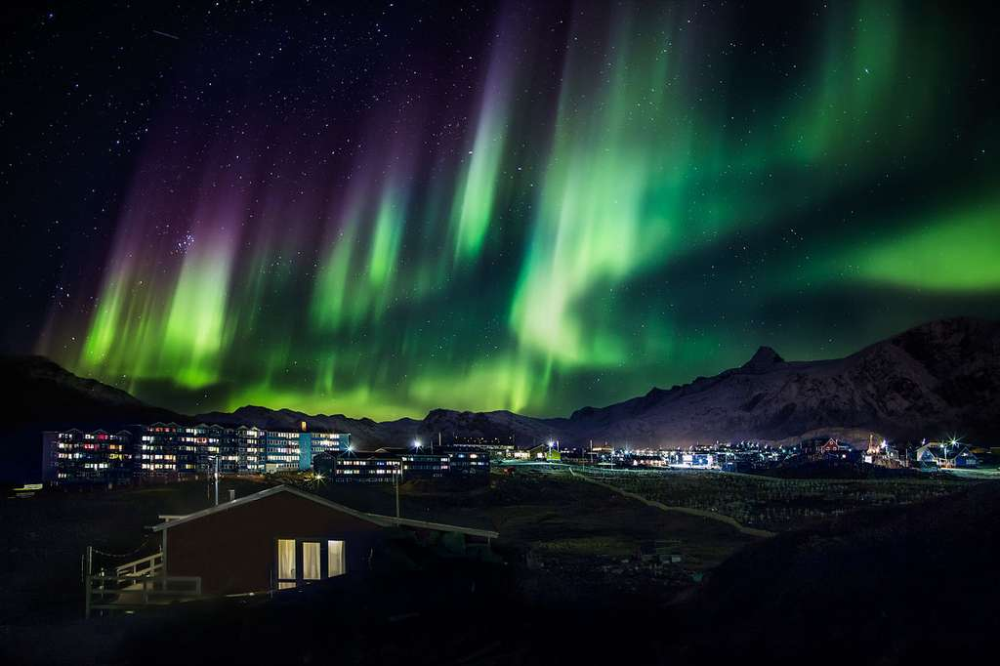

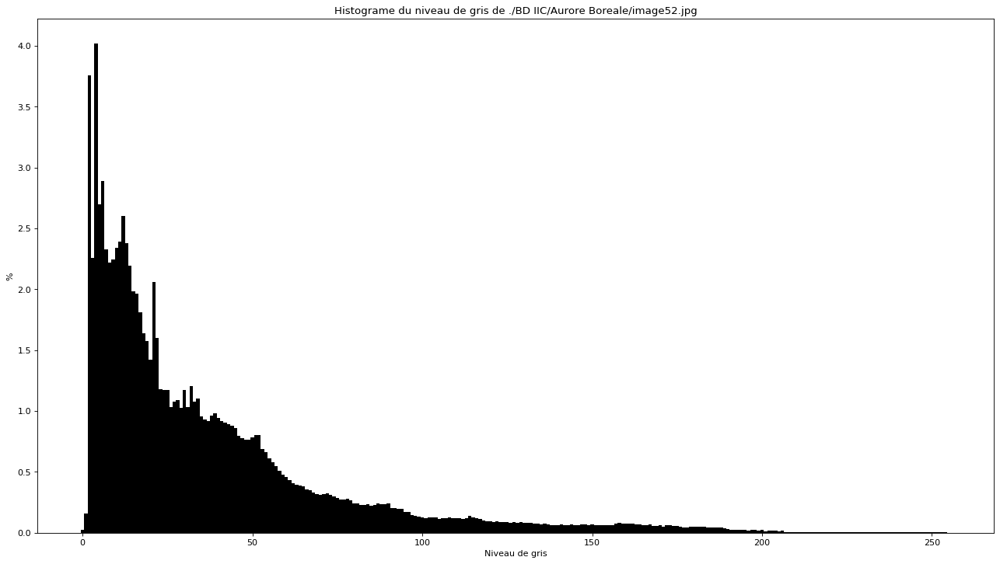

In [14]:
image = get_image("./BD IIC/Aurore Boreale/image52.jpg", afficher=True)
h = hist_ng(image)
plt.figure(figsize=(16, 9), dpi=80)
plt.title("Histograme du niveau de gris de ./BD IIC/Aurore Boreale/image52.jpg")
plt.bar(np.arange(len(h)), h * 100, color='black', width=1)
plt.tight_layout()
plt.xlabel("Niveau de gris")
plt.ylabel("%")
plt.show()

In [15]:
def hist_indexed(im, Qr, Qg, Qb):
	indexed_image = np.vectorize(get_index)(im[:, :, 0], im[:, :, 1], im[:, :, 2], Qr, Qg, Qb)
	v = np.append(indexed_image, 0)#np.arange(Qr * Qg * Qb))
	unique, counts = np.unique(v, return_counts=True)
	counts = counts - 1
	return counts / np.sum(counts)

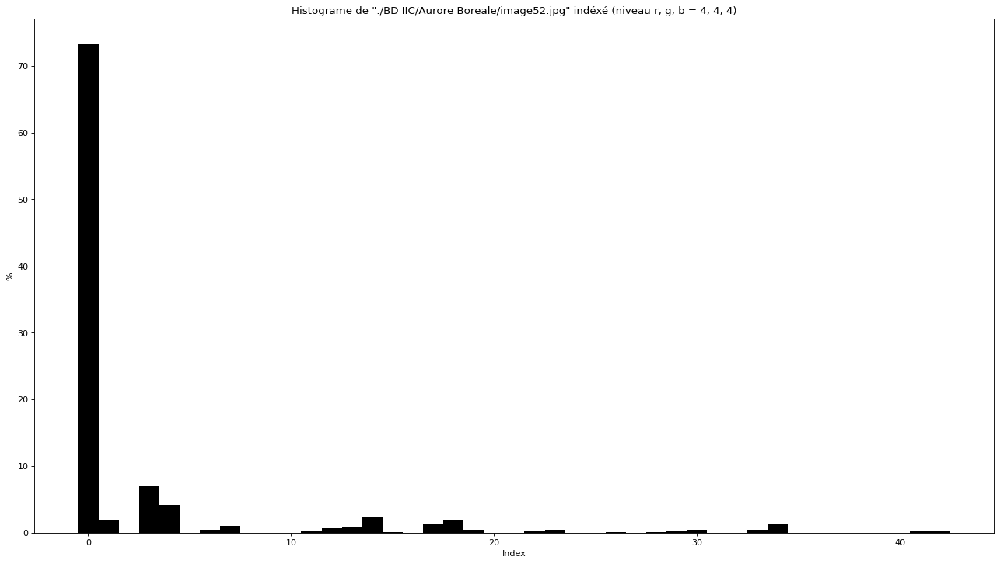

In [16]:
image = get_image("./BD IIC/Aurore Boreale/image52.jpg")
h = hist_indexed(image, 4,4,4)
plt.figure(figsize=(16, 9), dpi=80)
plt.title("Histograme de \"./BD IIC/Aurore Boreale/image52.jpg\" indéxé (niveau r, g, b = 4, 4, 4)")
plt.bar(np.arange(len(h)), h * 100, color='black', width=1)
plt.tight_layout()
plt.xlabel("Index")
plt.ylabel("%")
plt.show()

In [17]:
def hist_3composantes(im):
	r = im[:, :, 0]
	g = im[:, :, 1]
	b = im[:, :, 2]
	_, rc = np.unique(np.append(r, np.arange(256)), return_counts=True)
	_, gc = np.unique(np.append(g, np.arange(256)), return_counts=True)
	_, bc = np.unique(np.append(b, np.arange(256)), return_counts=True)
	
	h = np.concatenate([rc, gc, bc]) - 1
	return h / np.sum(h)

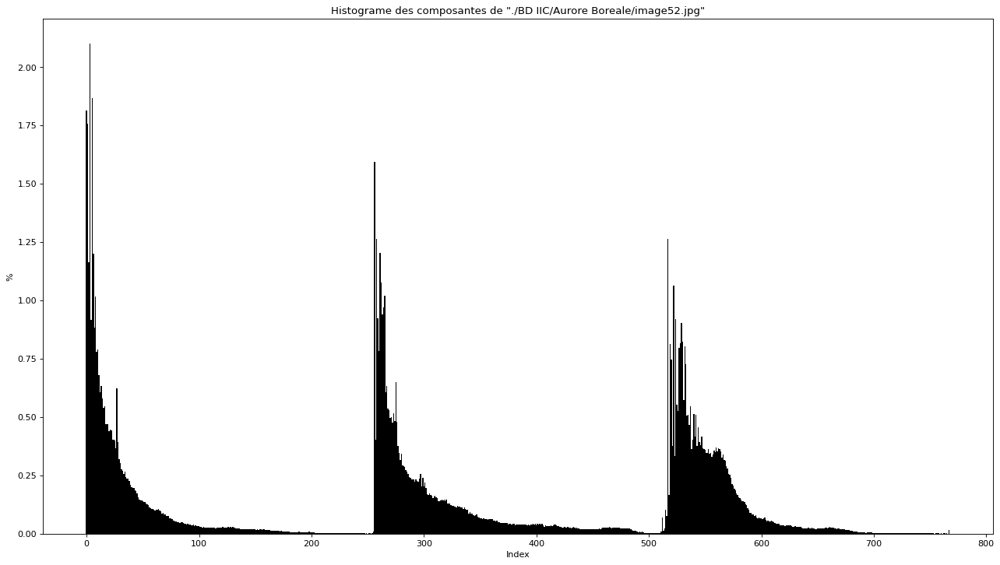

In [18]:
image = get_image("./BD IIC/Aurore Boreale/image52.jpg")
h = hist_3composantes(image)
plt.figure(figsize=(16, 9), dpi=80)
plt.title("Histograme des composantes de \"./BD IIC/Aurore Boreale/image52.jpg\"")
plt.bar(np.arange(len(h)), h * 100, color='black', width=1)
plt.tight_layout()
plt.xlabel("Index")
plt.ylabel("%")
plt.show()

No handles with labels found to put in legend.


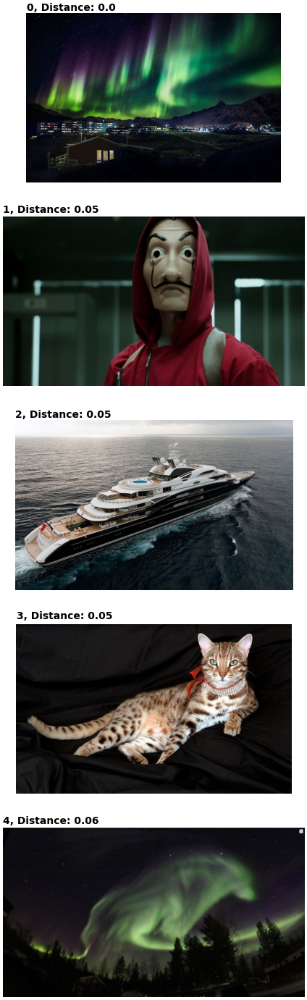

In [19]:
distanceBase = distance_image_base("./BD IIC/Aurore Boreale/image52.jpg", euclidian, hist_3composantes)
display_similar(request_image, distanceBase, 5)

14. Ecrire une fonction qui reçoit une image, les dimensions d'une grille, un nom de descripteur et qui calcule un descripteur globale concaténant des descripteurs locaux calculés sur des parties de l'image associées à a grille reçu. 

In [20]:
def conv(image, kernel=(3,3), desc=moy_var, descarg=()):
	r = kernel[0]
	c = kernel[1]
	if(len(kernel) != len(image.shape)):
		print(f"Warning: Le kernel n'est pas adapté à l'image\nLe kernel a {len(kernel)} dimentions et l'image {len(image.shape)} dimentions")
		p = len(image.shape) # mise à defaut
	else:
		p = kernel[2]
	
	concat_desc = []
	if(len(image.shape) == 2):
		w, h = image.shape
		# if r % h != 0 or c % w != 0:
		# 	warnings.warn("La taille du kernel n'est pas un multiple de l'image")
		# Note: si non multiple la sous matrice recupérée ignore l'overflow
		for i in range(0, w, r):
			for j in range(0, h, c):
				concat_desc.append(desc(image[i:i+r, j:j+c], *descarg))
	else:
		w, h, c = image.shape
		for i in range(0, w, r):
			for j in range(0, h, c):
				for k in range(0, c, p):
					concat_desc.append(desc(image[i:i+r, j:j+c, k:k+p], *descarg))
	
	return np.array(concat_desc)



In [21]:
image = get_image("./BD IIC/Aurore Boreale/image52.jpg")
desc = conv(image, kernel=(100,100,3)).flatten()
print(desc.shape, desc)

(4788,) [ 3.86333333 13.25576667  3.69       ... 12.1478048   3.28861789
 11.83133386]


In [22]:
# Je redefini une nouvelle fonction pour utiliser la convolution sur la base
# De plus pour pouvoir etre comparé les images doivent avoir la meme taille affin de pouvoir definir un descripteur de meme taille
def distance_conv_image_base(path, dist=euclidian, desc=moy_var, kernel=(3,3), image_size=(250,250)):
	image = get_image(path, image_size=image_size)
	descimage = conv(image, kernel=kernel, desc=desc)
	descimage=descimage.flatten()
	l = list()
	for root, dirs, files in os.walk("./BD IIC"):
		for f in files:
			if(f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg")):
				im = get_image(f"{root}/{f}", image_size=image_size)
				d = conv(im, kernel=kernel, desc=desc)
				d=d.flatten()
				l.append([dist(np.array(descimage), np.array(d)), f"{root}/{f}"])
	l = np.array(l)
	l = l[np.array(l[:, 0], dtype=float).argsort()]
	return l


On peut à present tester different descripteur en les convolutionnant sur nos images et tester differente distance aisin que different taille de kernel
Note: en fonction du descripteur cela peut prendre plue ou moins de temps (entre 10 et 60 secondes) 

No handles with labels found to put in legend.


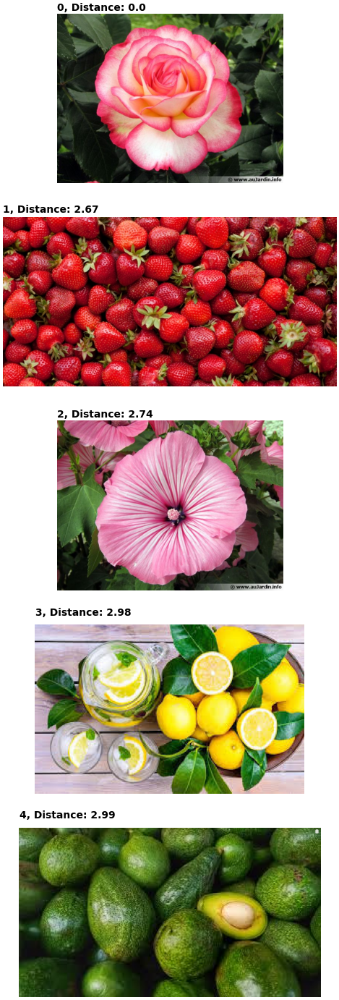

In [23]:
distanceBase = distance_conv_image_base("./BD IIC/Fleur/0601.jpg", dist=euclidian, desc=hist_ng, kernel=(100, 100, 3), image_size=(300, 300))
# print(distanceBase)
display_similar(request_image, distanceBase, 5)

No handles with labels found to put in legend.


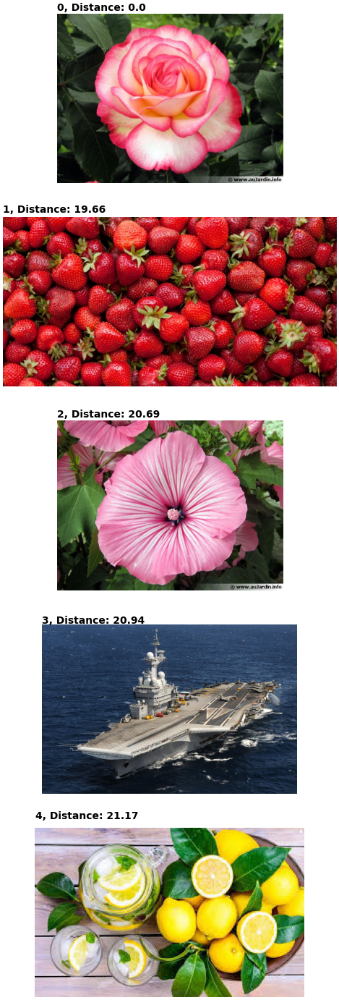

In [24]:
distanceBase = distance_conv_image_base("./BD IIC/Fleur/0601.jpg", dist=euclidian, desc=hist_ng, kernel=(10, 10, 3), image_size=(300, 300))
# print(distanceBase)
display_similar(request_image, distanceBase, 5)

Comme nous allons le voir dans cette dernière cellule les images avec un fond blanc biaisent le descripteur

Il pourait etre interessant de ne pas prendre en compte les valeurs extremement clair et extrement sombre ([255,255,255] et [0,0,0]) pour ne pas etre affecté par ces informations non pertinentes

No handles with labels found to put in legend.


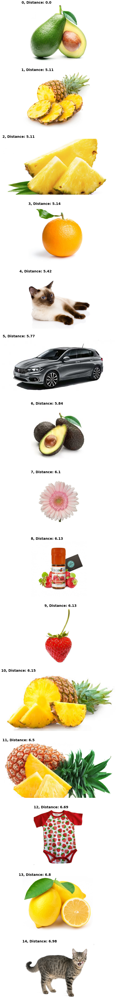

In [25]:
distanceBase = distance_conv_image_base("./BD IIC/Avocat/141.jpg", dist=euclidian, desc=hist_3composantes, kernel=(50, 50, 3), image_size=(300, 300))
# print(distanceBase)
display_similar(request_image, distanceBase, 15)


# TP2

In [46]:
def blob_histo(image, kernel=(3,3), nbColor=64, nbInterval=2):
    r = kernel[0]
    c = kernel[1]
    histo = np.zeros((nbColor, nbInterval))
    
    w, h = image.shape
    for i in range(0, w - r + 1, 1):
        for j in range(0, h - c + 1, 1):
            # display(image[i:i+r, j:j+c]) # [x0:y0, x1:y1]
            elements, counts = np.unique(image[i:i+r, j:j+c], return_counts=True)
            # display(elements, counts / (r * c))
            freqs = counts / (r * c)
            for element, freq in zip(elements, freqs):
                interval = int(freq * nbInterval) % nbInterval
                histo[element][interval] += 1
    return histo.reshape((-1))



In [28]:
Qr, Qg, Qb = 4, 4, 4
nbColor = (Qr * Qg * Qb)

def distance_image_base_blob(path, dist=euclidian, kernel=(3, 3), nbColor=nbColor, nbInterval=4):
    image = get_image(path, image_size=(200, 200))
    image = np.vectorize(get_index)(image[:, :, 0], image[:, :, 1], image[:, :, 2], Qr, Qg, Qb)
    descimage = blob_histo(image, kernel=kernel, nbColor=nbColor, nbInterval=nbInterval)
    l = list()
    for root, dirs, files in os.walk("./BD IIC"):
        for f in files:
            if(f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg")):
                display(f"{root}/{f}")
                im = get_image(f"{root}/{f}", image_size=(200, 200))
                im = np.vectorize(get_index)(im[:, :, 0], im[:, :, 1], im[:, :, 2], Qr, Qg, Qb)
                d = blob_histo(im, kernel=kernel, nbColor=nbColor, nbInterval=nbInterval)
                l.append([dist(np.array(descimage), np.array(d)), f"{root}/{f}"])
    l = np.array(l)
    l = l[np.array(l[:, 0], dtype=float).argsort()]
    return l



In [ ]:
request_image = "./BD IIC/Chat/13_1.jpg"
distanceBase = distance_image_base_blob(request_image, dist=euclidian, kernel=(10, 10), nbColor=nbColor, nbInterval=4)
display(distanceBase)

No handles with labels found to put in legend.


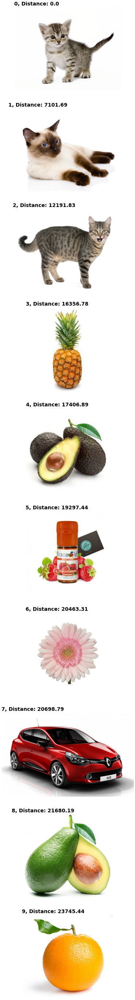

In [30]:
display_similar(request_image, distanceBase, k=10)

LBP Histogramme

In [31]:
def LBP_histo(image, kernel=(3,3)):
    r = kernel[0]
    c = kernel[1]
    w, h = image.shape
    final = np.empty((w - 2, h - 2))
    for i in range(0, w - r + 1, 1):
        for j in range(0, h - c + 1, 1):
            fenetre = image[i:i+r, j:j+c] # [x0:y0, x1:y1]
            center = fenetre[1, 1]
            fenetre = np.concatenate([fenetre[0,:-1], fenetre[:-1,-1], fenetre[-1,::-1], fenetre[-2:0:-1,0]])
            fenetre[np.where(fenetre < center)] = 0
            fenetre[np.where(fenetre >= center)] = 1
            valeur = fenetre.dot(2**np.arange(fenetre.size)[::-1])
            final[i, j] = valeur
           
    return final




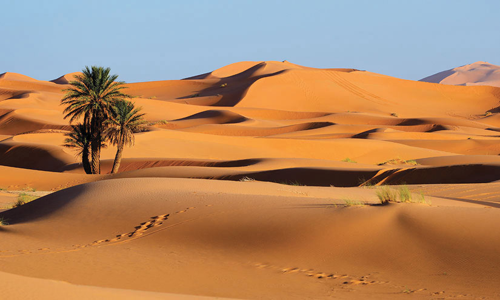

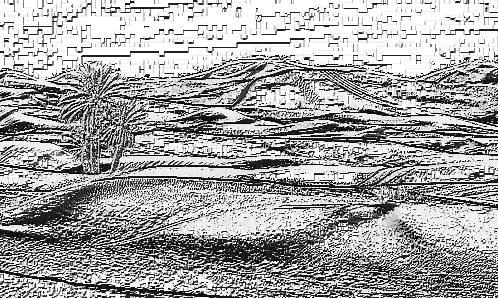

In [32]:
request_image = "./BD IIC/Desert/11.01.jpg"
image = get_image(request_image, afficher=True, image_size=(500, 300))
image = np.vectorize(to_ng)(image[:, :, 0], image[:, :, 1], image[:, :, 2], 1/3, 1/3, 1/3)
LBPimage = LBP_histo(image)
Image.fromarray(np.uint8(LBPimage))

In [33]:

def distance_image_base_LBP(path, dist=euclidian):
    image = get_image(path, image_size=(200, 200))
    image = np.vectorize(to_ng)(image[:, :, 0], image[:, :, 1], image[:, :, 2], 1/3, 1/3, 1/3) #on utilise le niveau de gris car une image indéxé n'aurait pas de sens ici
    descimage = LBP_histo(image)
    l = list()
    for root, dirs, files in os.walk("./BD IIC"):
        for f in files:
            if(f.endswith(".png") or f.endswith(".jpg") or f.endswith(".jpeg")):
                display(f"{root}/{f}")
                im = get_image(f"{root}/{f}", image_size=(200, 200))
                im = np.vectorize(to_ng)(im[:, :, 0], im[:, :, 1], im[:, :, 2], 1/3, 1/3, 1/3)
                d = LBP_histo(im)
                l.append([dist(np.array(descimage), np.array(d)), f"{root}/{f}"])
    l = np.array(l)
    l = l[np.array(l[:, 0], dtype=float).argsort()]
    return l


In [ ]:
request_image = "./BD IIC/Desert/11.01.jpg"
distanceBase = distance_image_base_LBP(request_image, dist=euclidian)
display(distanceBase)

No handles with labels found to put in legend.


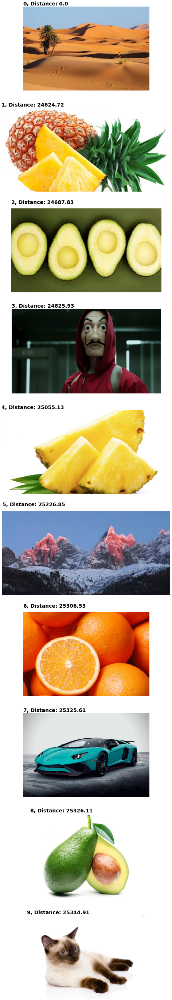

In [35]:
display_similar(request_image, distanceBase, k=10)

In [36]:
def HOB(image, filtre):
    r, c = filtre.shape
    w, h = image.shape
    final = np.zeros((w-2, h-2))
    
    for i in range(0, w - r + 1, 1):
        for j in range(0, h - c + 1, 1):
            v = np.sum(image[i:i+r, j:j+c] * filtre)
            final[i, j] = v
    return final

sobelH = np.array([[1, 2, 1],
                  [0, 0, 0],
                  [-1, -2, -1]])

sobelV = np.array([[1, 0, -1],
                  [2, 0, -2],
                  [1, 0, -1]])


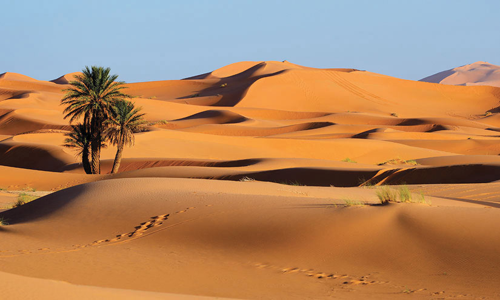

608.0

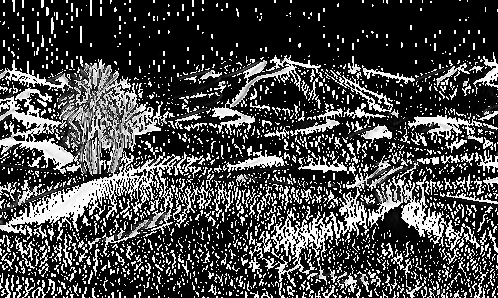

608.3333333333333

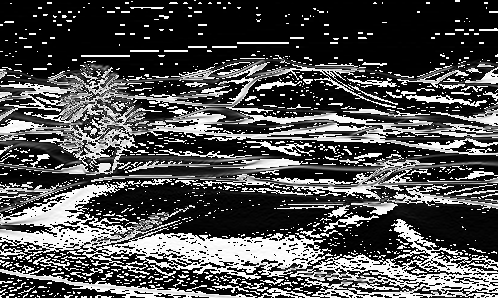

In [37]:
request_image = "./BD IIC/Desert/11.01.jpg"
image = get_image(request_image, afficher=True, image_size=(500, 300))
image = np.vectorize(to_ng)(image[:, :, 0], image[:, :, 1], image[:, :, 2], 1/3, 1/3, 1/3)
LBPimage = HOB(image, sobelV)
display(np.max(LBPimage))
display(Image.fromarray(np.uint8((LBPimage / np.max(LBPimage)) * 255)))
LBPimage = HOB(image, sobelH)
display(np.max(LBPimage))
display(Image.fromarray(np.uint8((LBPimage / np.max(LBPimage)) * 255)))